# Week 4: Make it interactive and viz wrap-up

+ 이번 시간에는 지금까지 익힌 시각화 방법들을 되새기면서, 기타 시각화 방법들에 관해 알아보겠습니다.

## 0. Why data matters?- REVISITED
+ 왜 우리는 1주차에 그토록 많은 시간과 노력을 들여서 데이터를 '만지는' 방법을 배웠을까요?
+ __'시각화'만을 목적으로 한다고 해도, 시각화 '방법'을 활용하려면 '방법'이 요구하는 데이터 '구조'를 이해해서 데이터를 그에 맞게 가공해야 합니다.__ 따라서 데이터를 가공하는 방법에 익숙해져야만 데이터를 이용한 시각화도 어려움 없이 수행할 수 있습니다.
+ 우리는 1주차에 다양한 데이터 가공 방법을 배워보았습니다. 특히 long-wide 변환(`tidyr::gather`, `tidyr::spread`)이나 `dplyr::group_by`, `dplyr::summarize`같은 함수들을 우리는 아주 자주 쓰게 될 것입니다.
+ `dplyr::filter`을 사용하기 위해서 논리식 작성법에 특히 익숙해져야 합니다. `grepl`, `%in%`, `==`, `>=`, `<=`, `<`, `>`, `&`, `|` 등의 사용 방법을 기억하고 계신가요?
+ 또한 `group`을 이루도록 하는 범주화 변수들과 관련해서 `factor`도 배웠습니다. `factor`, 특히 `levels`에 대한 이해가 명확하게 되어야 시각화의 세부 내용을 의도한대로 구성할 수 있습니다.

## 1. Interactive visualization with `plotly`

### Plotly
+ `plotly`는 `ggplot2`로 만든 시각화 결과를 interactive하게 만들어 주는 패키지입니다.
+ `plot_ly`로 새로운 plot 만들기
    + 원리는 plain R에서의 시각화 방법과 유사합니다. x와 y 좌표가 각각 어느 필드에 매핑될지를 설정해 주면 간단한 형태의 산점도를 만들어볼 수 있습니다.
+ `ggplot`과 `plotly::ggplotly`
    + `ggplotly`에 만들어 둔 `ggplot` 객체를 넣어서 실행하면 결과가 interactive하게 표시됩니다.
    + Jupyter notebook에서는 `ggplotly`가 정상 표시되지 않으므로, RStudio 등에서 따로 실행해 보십시오.
        + Chrome 브라우저를 사용하면 결과가 정상 표시됩니다.

In [18]:
library(tidyverse)
library(sf)
library(plotly)
library(r2d3)
library(networkD3)

### Gu_code에 관한 정보
+ 구별 코드가 익숙하지 않은 분들을 위해서, `sf`에서 동별 polygon을 구에 따라서 dissolve한 뒤 구별 코드를 레이블로 표시했습니다.
+ dissolve가 이루어지는 양상을 잘 관찰해 보십시오.
+ 안타깝게도 서울특별시 행정동 폴리곤의 점들이 제대로 배열되지 않은 것 같습니다. dissolve한 결과에 군더더기(짧은 선으로 된 부분이라던지)가 많이 보입니다.
+ 군더더기는 무시하고, 구별 코드를 잘 살펴보시기 바랍니다.
    + 대략의 부여 원칙을 말하자면, 종로구(11010)에서 시작해서 강북 지역으로 반시계방향으로 돌아가면서 코드가 부여되다가, 은평구(11120)에서 이어받은 뒤 다시 반시계방향으로 부여되고 있습니다. 마지막 코드는 강동구(11250)입니다.

Warning message in st_centroid.sf(gu_s):
"st_centroid assumes attributes are constant over geometries of x"Warning message in st_centroid.sfc(st_geometry(x), of_largest_polygon = of_largest_polygon):
"st_centroid does not give correct centroids for longitude/latitude data"Warning message in text.default(gu_sc[, 1], gu_sc[, 2], labels = gu_s$GU, col = "blue", :
"font family not found in Windows font database"

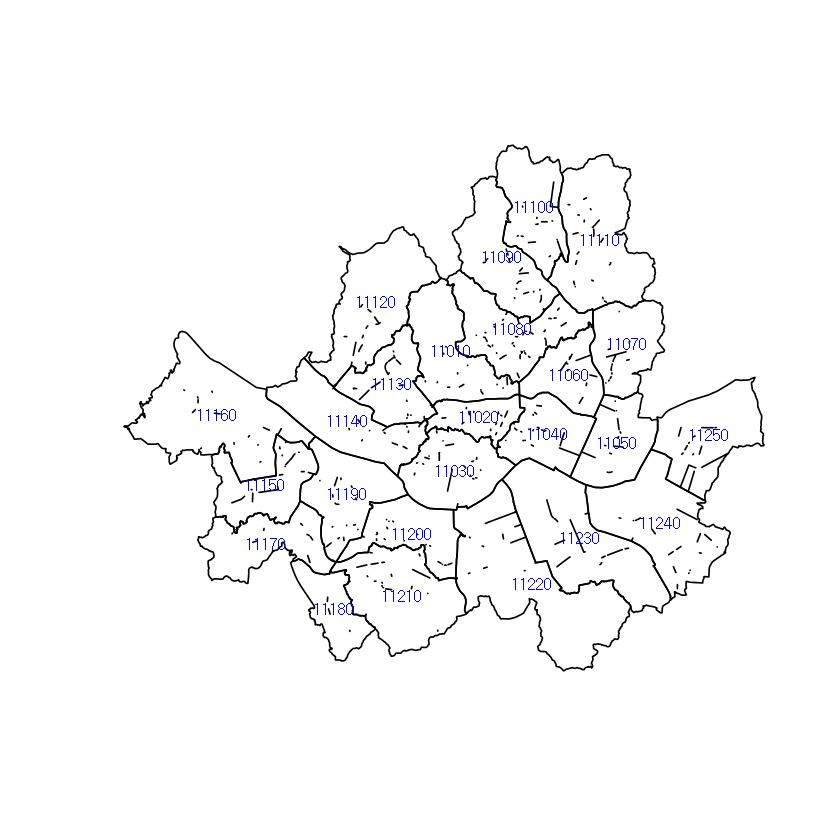

In [57]:
gu_s <- dong_sl %>%
    group_by(GU) %>%
    summarize() %>%
    ungroup

gu_sc <- st_centroid(gu_s) %>% st_coordinates
plot(st_geometry(gu_s))
text(gu_sc[,1], gu_sc[,2], 
     labels = gu_s$GU,
     col = 'blue', cex = 0.8)

+ 아래 예제는 `geom_sf`가 적용된 1인가구 지도를 interactive map으로 만든 것인데, 경위도 비례가 맞지 않아 다소 왜곡된 결과를 보여주고 있어 사용에 주의를 요합니다.

In [24]:
dong_s <- st_read('C:/Users/sigma/Dropbox/Chores/2018S/GeoCONDA/W3/Dong_House.shp')
# only valid in ggplot2 v.3.0.0
dong_gg_h1 <- ggplot(data = dong_s) +
    geom_sf(mapping = aes(fill = h_p1), col = 'white', lwd = 0.2) +
    coord_equal()

p <- ggplotly(
  dong_gg_h1
) 

p

options:        ENCODING=CP949 
Reading layer `Dong_House' from data source `C:\Users\sigma\Dropbox\Chores\2018S\GeoCONDA\W3\Dong_House.shp' using driver `ESRI Shapefile'


Warning message in CPL_read_ogr(dsn, layer, as.character(options), quiet, type, :
"GDAL Message 1: One or several characters couldn't be converted correctly from CP949 to UTF-8.  This warning will not be emitted anymore"

Simple feature collection with 424 features and 12 fields
geometry type:  POLYGON
dimension:      XY
bbox:           xmin: 126.7643 ymin: 37.42849 xmax: 127.1836 ymax: 37.70138
epsg (SRID):    4326
proj4string:    +proj=longlat +datum=WGS84 +no_defs


HTML widgets cannot be represented in plain text (need html)

In [59]:
dong_sl <- dong_s %>%
    gather(key = hclass, value = val, 5:12) %>%
    filter(hclass != 'h_total') %>%
    mutate(members = substr(hclass, 4, 5),
           members = plyr::mapvalues(members, c('7'), c('more than 7')),
           GU = substr(ADM_DR_CD, 1, 5),
           val = as.integer(val))

dong_gg_hs <- ggplot(data = dong_sl) +
    geom_bar(mapping = aes(y = val, x = members), stat = 'sum') +
    facet_wrap(~ GU, ncol = 4)

ggplotly(dong_gg_hs)

Warning message:
"attributes are not identical across measure variables;
they will be dropped"Warning message in evalq(as.integer(val), <environment>):
"NAs introduced by coercion"Warning message:
"Removed 13 rows containing non-finite values (stat_sum)."

HTML widgets cannot be represented in plain text (need html)

In [30]:
str(dong_sl)

Classes 'sf' and 'data.frame':	2968 obs. of  9 variables:
 $ ADM_DR_CD: int  1115051 1115053 1115054 1115057 1115058 1115059 1115060 1115061 1115062 1115063 ...
 $ BASE_YEAR: int  2015 2015 2015 2015 2015 2015 2015 2015 2015 2015 ...
 $ ADM_DR_NM: Factor w/ 36 levels "??","???","????",..: 32 34 35 8 14 20 23 25 27 29 ...
 $ SGIS_2015: Factor w/ 424 levels "1101053","1101054",..: 223 225 226 227 228 229 230 231 232 233 ...
 $ hclass   : chr  "h_p1" "h_p1" "h_p1" "h_p1" ...
 $ val      : chr  "1121" "2095" "1793" "2864" ...
 $ members  : chr  "1" "1" "1" "1" ...
 $ GU       : chr  "11150" "11150" "11150" "11150" ...
 $ geometry :sfc_POLYGON of length 2968; first list element: List of 1
  ..$ : num [1:31, 1:2] 127 127 127 127 127 ...
  ..- attr(*, "class")= chr  "XY" "POLYGON" "sfg"
 - attr(*, "sf_column")= chr "geometry"
 - attr(*, "agr")= Factor w/ 3 levels "constant","aggregate",..: NA NA NA NA NA NA NA NA
  ..- attr(*, "names")= chr  "ADM_DR_CD" "BASE_YEAR" "ADM_DR_NM" "SGIS_2015" ...

### `plot_ly` 컨트롤
+ 변수의 구분: tilde(`~`)로 시작하며, `ggplot`에서와 마찬가지로 변수 이름을 따옴표 없이 지정합니다.
+ `data`: 투입할 자료 이름입니다. 주로 `data.frame`입니다.
+ `type`: 어떠한 형식으로 자료를 표시할지에 대한 정보입니다. `character`가 들어갑니다.
    + `bar`: 막대그래프
    + `scatter`, `scatter3d`: 산점도 (3개의 변수를 이용할 때는 `scatter3d`)
    + `box`: 상자그림
    + `heatmap`: 온도지도
    + `histogram`, `histogram2d`, `histogram2dcontour`: 히스토그램 (복수의 변수를 이용할 때는 `histogram2d`)
    + `pie`: 파이차트
    + `surface`: 평면
    + 이외의 정보는 `?plot_ly`로 확인해 보십시오.
+ `frame`: `ggplot`에서 `facet`과 유사한 기능을 합니다. 그래프를 구조화하여 보여주고, 동적으로 조회하거나 애니메이션으로 결과를 표시할 수 있게 해 줍니다. 아래 사례에서는 구에 따라서 정리했습니다.
+ `split`: 자료를 분할하여 표시할 때, `ggplot`에서 일종의 `group`과 같은 역할을 합니다. 아래 예제에서는 `frame`과 `split`을 둘 다 사용했기 때문에 범례에서 '구' 코드가 표시됩니다. 만약 split... 을 주석 처리하면 범례에서 '구' 코드가 사라집니다.
+ `color`: 개별 막대의 색상을 설정합니다. 단일 색상으로 설정하고 싶으면 `I()` 함수를 이용해서 설정해야 합니다. 예를 들어, `I('red')`
+ `x`: x축에 어떤 값을 넣을지를 나타냈습니다.

In [80]:
dong_ss <- dong_sl %>% 
    group_by(GU, members) %>%
    summarize(val = sum(val)) %>%
    ungroup

plot_ly(data = dong_ss, type = 'bar', frame = ~GU,
        split = ~GU, 
        color = ~members,  
        x = ~val)

Warning message:
"Ignoring 8 observations"Warning message in p$x$data[firstFrame] <- p$x$frames[[1]]$data:
"number of items to replace is not a multiple of replacement length"

HTML widgets cannot be represented in plain text (need html)

## 2. Leaflet
+ `leaflet`은 데이터와 인터넷 지도를 매시업(mash-up)하여 주는 패키지입니다.
+ 데이터의 epsg 코드는 4326이어야 합니다. `leaflet`에서 이용하는 배경지도인 openstreetmap이 4326 좌표체계를 따르고 있기 때문입니다.
+ 우리가 이용하는 `dong_s` 자료는 epsg:4326으로 된 자료이므로 그대로 이용해도 무방합니다.
+ 아래 예제를 줄별로 설명해 드리겠습니다. 주석을 참고해 주십시오. 실제 실행은 데이터를 불러들이는 위의 코드와 함께 아래 코드 블록을 옮긴 후, RStudio 등에서 실행해 보십시오. 
+ `addPolygons` 외에, 지리정보의 형태에 따라서 아래의 함수들을 적용해볼 수 있습니다.
    + `addMarkers`: 지정된 좌표에 미리 지정된 그림으로 위치를 표시해 줍니다.
    + `addPolylines`: 선을 표시해 줍니다.
    + `addRasterImage`: 래스터 형태의 이미지(물론 좌표를 가지고 있어야 합니다!)를 표시해 줍니다.
    + 세부 설정은 아래 예제를 참고하여 적용해 보십시오.

In [ ]:
library(leaflet) # 라이브러리 호출
pal <- colorBin("YlOrRd", domain = dong_s$h_p1) # domain에서 대상 값들을 입력합니다. 팔레트 이름은 'YlOrRd'로, 'Yellow-Orange-Red'를 의미합니다. 별도로 bin을 설정하지 않는 한, 최댓값과 최솟값을 이용해서 자동으로 몇 개의 bin을 만들어냅니다. 
labels <- sprintf( # 아래 leaflet을 실제 호출하는 단계에서 html 코드 형식으로 tooltip(마우스 커서를 올려놓은 객체 위로 떠오르는 메시지 또는 도움말)을 넣어주는 코드입니다.
  "Households: <strong>%s</strong><br/>",
  dong_s$h_p1
) %>% lapply(htmltools::HTML) # 위에서 결과가 표현되는 class는 list입니다. 따라서 pipeline operator과 lapply를 이용해서 모든 객체에 HTML 코드임을 나타내도록 합니다.


leaflet(dong_s) %>% # leaflet에서는 sf object도 인식합니다. epsg:4326이므로 좌표계를 따로 신경쓰지 않아도 됩니다.
    setView(127.0, 37.55, 11) %>% # 중심점과 zoom level을 입력합니다.
    addTiles() %>% # Tile map (인터넷 연결이 필요합니다)을 배경에 넣어 줍니다. 기본값은 OpenStreetMap입니다.
    addPolygons( # Polygon을 추가한다는 뜻입니다. dong_s 객체가 POLYGON이라는 점을 떠올려 보십시오.
        fillColor = ~pal(h_p1), # plot_ly 사례에서와 마찬가지로, 변수이름을 tilde 뒤에 표시합니다. 단, fillColor에서는 색상 정보를 입력해 주어야 하므로 pal 안에 변수 이름을 넣었습니다.
        weight = 2, # 테두리 두께입니다
        opacity = 1, # 테두리의 투명도를 조절합니다.
        color = "white", # 테두리의 색상입니다
        dashArray = "3", # 경계의 점선을 어떤 스타일로 표시하는가를 결정합니다.
        fillOpacity = 0.7, # 채울 색상의 투명도를 조절합니다. 
        highlight = highlightOptions( # 커서가 가리키는 단일 폴리곤을 어떻게 강조할지 설정합니다. highlightOptions 함수가 이용됩니다.
            weight = 5, # 테두리 두께입니다.
            color = "#666", # 테두리 색상입니다.
            dashArray = "", # 실선을 적용합니다.
            fillOpacity = 0.7, # 강조된 폴리곤의 색상 투명도를 조절합니다. 위에서 설정한 값과 같으므로 변동 없습니다.
            bringToFront = TRUE), # 만약 겹친 부분이 있다면 무시하고 선택된 폴리곤을 가장 앞으로 가져와 보여줍니다.
        label = labels, # 표시할 레이블의 html 코드입니다. 위 코드에서 알 수 있듯이 list객체입니다.
        labelOptions = labelOptions( # 레이블에 대한 세부조정입니다.
            style = list("font-weight" = "normal", padding = "3px 8px"), # 기본 글꼴 굵기와 좌우 여백을 몇 픽셀로 할지 결정합니다.
            textsize = "15px", # 기본 글꼴 크기를 몇 픽셀로 할지 결정합니다.
            direction = "auto")) %>%
    addLegend(pal = pal,  # addLegend는 설정된 위치에 범례를 생성하는 함수입니다.
              values = ~h_p1, # 대상 값들을 h_p1 필드로 넣되, 앞서 말씀드린 대로 tilde 뒤에 변수명을 표시했습니다.
              opacity = 0.7, # 범례 투명도를 조정합니다.
              title = NULL, # 범례 제목에는 NULL을 넣어 아무것도 표시되지 않게 했습니다.
              position = "bottomright") # 위치는 아래, 오른쪽입니다.

## 3. Network visualization

+ 이용 자료는 KTDB에서 구득한 2014년 통행량자료입니다. 수단별 기-종점(O-D) 산정 통행량을 담고 있습니다.
+ 파일에서 보듯이, 필드 이름이 없는 고정길이 텍스트(fixed-width text) 파일이기 때문에, 아래 코드 블록에서는 필드가 가지는 길이와 이름을 고려해서 별도로 설정 항목을 만든 뒤에 읽어들였습니다.
    + 영문 필드명을 구성하는 과정에서 아래 한글로 된 주석을 참고했습니다. 이 내용은 "2015년 수도권 교통분석 기초자료 O/D 및 NETWORK자료 설명서 (수도권교통본부, 2016)"에서 가져왔습니다.
+ 진행 과정에 주목하십시오.
+ __ 미완된 시각화 내용은 보충하여 다시 올려드리겠습니다. __

In [90]:
# 1 기점_존번호 정수형 TAZ 2 기점_CODE 정수형 행정코드 3 기점_노드 정수형 Node_ID 4 종점_존번호 정수형 TAZ 5 종점_CODE 정수형 행정코드 
# 6 종점_노드 정수형 Node_ID 7 도보 실수형 8 승용차 실수형 9 승용차 동승 실수형 10 시내버스 실수형 11 시외버스 실수형 12 마을버스 실수형 
# 13 광역버스 실수형 14 고속버스 실수형 15 기타버스 실수형 16 지하철/전철 실수형 17 일반철도 실수형 18 고속철도 실수형 19 택시 실수형 
# 20 소형화물차 실수형 21 중⋅대형화물차 실수형 22 오토바이 실수형 23 자전거 실수형 24 기타 실수형

Your code contains a unicode char which cannot be displayed in your
current locale and R will silently convert it to an escaped form when the
R kernel executes this code. This can lead to subtle errors if you use
such chars to do comparisons. For more information, please see
https://github.com/IRkernel/repr/wiki/Problems-with-unicode-on-windows

In [158]:
## OD data import
coln <- c('ID_OZ', 'ID_OC', 'NODE_O', 'ID_DZ', 'ID_DC', 'NODE_D', 'walk', 'auto_p', 'auto_pr', 'bus_intra', 'bus_inter', 'bus_town', 'bus_metro', 'bus_exp', 'bus_etc',
          'metro', 'rail_ord', 'rail_exp', 'taxi', 'truck_sma', 'truck_mel', 'bike', 'cycle', 'ETC')
collen <- c(6,10,10,5,10,10,rep(12, 18))
od <- readr::read_fwf(file = 'C:/Users/sigma/Dropbox/Chores/2018S/GeoCONDA/W4/OD_MODE.TXT', 
                      col_positions = fwf_widths(widths = collen, col_names = coln),
                      col_types = 'iiiiiidddddddddddddddddd')

Warning message in rbind(names(probs), probs_f):
"number of columns of result is not a multiple of vector length (arg 1)"Warning message:
"583516 parsing failures.
row # A tibble: 5 x 5 col     row col   expected actual file                                              expected   <int> <chr> <chr>    <chr>  <chr>                                             actual 1     1 ETC   12 chars 11     'C:/Users/sigma/Dropbox/Chores/2018S/GeoCONDA/W4~ file 2     2 ETC   12 chars 11     'C:/Users/sigma/Dropbox/Chores/2018S/GeoCONDA/W4~ row 3     3 ETC   12 chars 11     'C:/Users/sigma/Dropbox/Chores/2018S/GeoCONDA/W4~ col 4     4 ETC   12 chars 11     'C:/Users/sigma/Dropbox/Chores/2018S/GeoCONDA/W4~ expected 5     5 ETC   12 chars 11     'C:/Users/sigma/Dropbox/Chores/2018S/GeoCONDA/W4~
... ................. ... ............................................................................... ........ ............................................................................... ...... ..........

In [159]:
head(od)
od <- od %>% mutate(group = substr(ID_DC, 1, 5))
od_sub <- od %>% 
    filter(walk != 0)
    #filter(grepl('^11210*', ID_OC) & grepl('^11210*', ID_DC))
dim(od_sub)
head(od_sub)

ID_OZ,ID_OC,NODE_O,ID_DZ,ID_DC,NODE_D,walk,auto_p,auto_pr,bus_intra,...,bus_etc,metro,rail_ord,rail_exp,taxi,truck_sma,truck_mel,bike,cycle,ETC
1,1101053,46278,1,1101053,46278,9693.845,539.008,285.181,1828.001,...,799.815,588.540,0,0,280.639,0,0,118.136,0.000,0
2,1101054,46279,1,1101053,46278,113.809,0.000,0.000,65.454,...,0.000,146.917,0,0,180.114,0,0,0.000,15.385,0
3,1101055,46280,1,1101053,46278,0.000,210.687,48.493,5991.198,...,45.441,1.729,0,0,260.884,0,0,0.000,0.000,0
4,1101056,46281,1,1101053,46278,0.000,449.419,244.390,9929.396,...,0.000,0.000,0,0,826.286,0,0,0.000,0.000,0
5,1101057,46282,1,1101053,46278,72.018,72.260,24.593,676.951,...,50.222,95.877,0,0,90.096,0,0,0.000,0.000,0
6,1101058,46283,1,1101053,46278,220.850,40.790,75.753,316.167,...,0.000,13.790,0,0,123.785,0,0,0.000,0.000,0


[1] 21677    25

ID_OZ,ID_OC,NODE_O,ID_DZ,ID_DC,NODE_D,walk,auto_p,auto_pr,bus_intra,...,metro,rail_ord,rail_exp,taxi,truck_sma,truck_mel,bike,cycle,ETC,group
1,1101053,46278,1,1101053,46278,9693.845,539.008,285.181,1828.001,...,588.540,0,0,280.639,0.000,0,118.136,0.000,0,11010
2,1101054,46279,1,1101053,46278,113.809,0.000,0.000,65.454,...,146.917,0,0,180.114,0.000,0,0.000,15.385,0,11010
5,1101057,46282,1,1101053,46278,72.018,72.260,24.593,676.951,...,95.877,0,0,90.096,0.000,0,0.000,0.000,0,11010
6,1101058,46283,1,1101053,46278,220.850,40.790,75.753,316.167,...,13.790,0,0,123.785,0.000,0,0.000,0.000,0,11010
8,1101061,46285,1,1101053,46278,705.841,254.636,102.502,1011.249,...,1927.701,0,0,431.390,46.472,0,0.000,0.000,0,11010
9,1101063,46286,1,1101053,46278,65.813,72.442,0.000,546.865,...,260.699,0,0,50.565,0.000,0,0.000,0.000,0,11010


In [160]:
od_sub <- od_sub %>%
    mutate(ID_DC = as.character(ID_DC),
           ID_OC = as.character(ID_OC),
           ID_DZ = as.character(ID_DZ),
           ID_OZ = as.character(ID_OZ))
#colnames(od_sub) <- gsub('_', '', colnames(od_sub))
#colnames(od) <- gsub('_', '', colnames(od))
nodes <- od %>% dplyr::select(ID_DC, group) %>% unique %>% mutate(weight = 6, name = ID_DC)
links <- od_sub %>% dplyr::select(ID_OC, ID_DC, walk) %>% mutate(walk = floor(walk))

In [161]:
head(nodes)

ID_DC,group,weight,name
1101053,11010,6,1101053
1101054,11010,6,1101054
1101055,11010,6,1101055
1101056,11010,6,1101056
1101057,11010,6,1101057
1101058,11010,6,1101058


IGRAPH dccb2bc UN-- 1236 21677 -- 
+ attr: name (v/n), group (v/c), weight (v/n), walk (e/n)
+ edges from dccb2bc (vertex names):
 [1] 1101053--1101053 1101053--1101054 1101053--1101057 1101053--1101058
 [5] 1101053--1101061 1101053--1101063 1101053--1101064 1101053--1101065
 [9] 1101053--1101066 1101053--1101067 1101053--1101068 1101053--1101070
[13] 1101053--1101072 1101053--1102052 1101053--1102054 1101053--1102055
[17] 1101053--1102059 1101053--1102066 1101053--1105062 1101053--1106081
[21] 1101053--1107071 1101053--1108065 1101053--1112057 1101053--1112059
[25] 1101053--1113052 1101053--1113073 1101053--1116057 1101053--1120052
[29] 1101053--1120054 1101053--1120069 1101053--1121068 1101053--1124056
+ ... omitted several edges

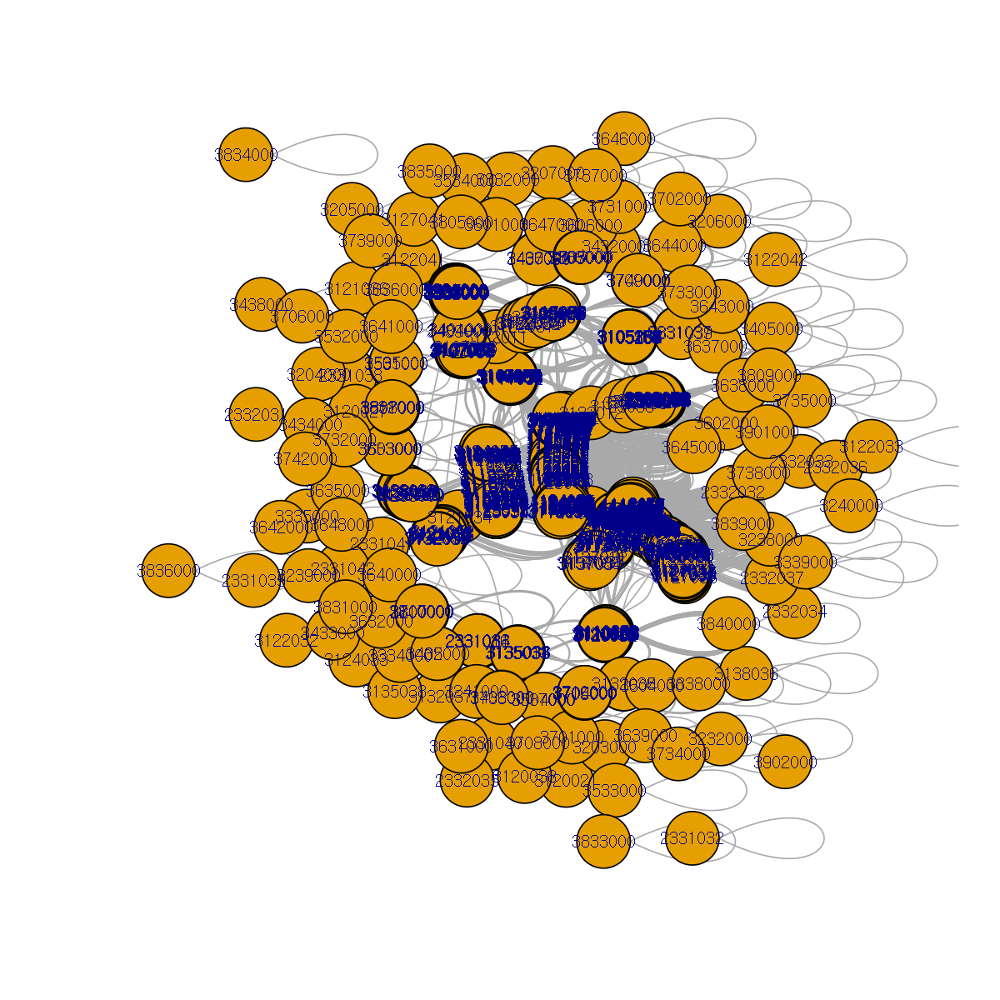

In [166]:
library(igraph)
network <- graph_from_data_frame(d=links, vertices=nodes, directed=F)
network
plot(network,
     size = 8,
     label.cex = 0.2)

In [163]:
forceNetwork(Links=links, Nodes=nodes, 
             Group = "group",
             NodeID = 'name',
             Source = 'ID_OC', 
             Target = 'ID_DC',
        
        # -- custom nodes and labels
        #Nodesize=3,                                                    # column names that gives the size of nodes
        radiusCalculation = JS("10"),                         # How to use this column to calculate radius of nodes? (Java script expression)
        opacity = 0.6,                                                      # Opacity of nodes when you hover it
        opacityNoHover = 0.6,                                               # Opacity of nodes you do not hover
        #colourScale = JS("d3.scaleOrdinal(d3.schemeCategory30);"),          # Javascript expression, schemeCategory10 and schemeCategory20 work
        fontSize = 17,                                                      # Font size of labels
        fontFamily = "serif",                                               # Font family for labels
 
        # custom edges
        Value="walk",
        arrows = TRUE,                                                     # Add arrows?
        linkColour = c("grey"),                                    # colour of edges
        linkWidth = JS("function(d) { return Math.sqrt(d.value); }"),       # edges width
 
        # layout
        linkDistance = 250,                                                 # link size, if higher, more space between nodes
        #charge = -50,                                                       # if highly negative, more space betqeen nodes
                
        # -- general parameters
        height = NULL,                                                      # height of frame area in pixels
        width = NULL,
        zoom = TRUE,                                                        # Can you zoom on the figure
        #legend = TRUE,                                                      # add a legend?
        bounded = F,
        clickAction = NULL
        )
 

Links is a tbl_df. Converting to a plain data frame.
Nodes is a tbl_df. Converting to a plain data frame.


HTML widgets cannot be represented in plain text (need html)

In [167]:
data(MisLinks)
data(MisNodes)
MyClickScript <- 'alert("You clicked " + d.name + " which is in row " +
       (d.index + 1) +  " of your original R data frame");'

forceNetwork(Links = MisLinks, Nodes = MisNodes, Source = "source",
             Target = "target", Value = "value", NodeID = "name",
             Group = "group", opacity = 1, zoom = FALSE,
             bounded = TRUE, clickAction = MyClickScript)

HTML widgets cannot be represented in plain text (need html)

### 연습문제
+ 주어진 자료를 이용해 아래와 같이 `ggplot`을 생성했습니다.
+ 아래와 같은 결과를 얻으려면 밑줄 친 부분에 어떤 코드를 넣어야 할까요? 문제를 풀고 코드를 실행하여 확인해 보십시오.

In [84]:
dat <- readRDS('C:/Users/sigma/Dropbox/Chores/2018S/GeoCONDA/W4/Example.rds')
str(dat)
head(dat)

Classes 'tbl_df', 'tbl' and 'data.frame':	5256 obs. of  9 variables:
 $ TMSID  : chr  "111121" "111122" "111123" "111124" ...
 $ YEAR   : int  2010 2010 2010 2010 2010 2010 2010 2010 2010 2010 ...
 $ PM10   : num  48.9 51.4 50.3 49.7 57.7 ...
 $ NO2    : num  0.0333 0.0544 0.0357 0.0455 0.0461 ...
 $ partial: chr  "MR1_L_00300" "MR1_L_00300" "MR1_L_00300" "MR1_L_00300" ...
 $ val    : num  0 0 0 0 0 ...
 $ SIDO_CD: Factor w/ 17 levels "11","21","22",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ weight : chr  "MR1_L" "MR1_L" "MR1_L" "MR1_L" ...
 $ radius : int  300 300 300 300 300 300 300 300 300 300 ...


TMSID,YEAR,PM10,NO2,partial,val,SIDO_CD,weight,radius
111121,2010,48.87714,0.03332188,MR1_L_00300,0,11,MR1_L,300
111122,2010,51.40806,0.05439259,MR1_L_00300,0,11,MR1_L,300
111123,2010,50.29693,0.03565006,MR1_L_00300,0,11,MR1_L,300
111124,2010,49.68360,0.04553841,MR1_L_00300,0,11,MR1_L,300
111125,2010,57.72332,0.04608302,MR1_L_00300,0,11,MR1_L,300
111131,2010,50.02857,0.03763314,MR1_L_00300,0,11,MR1_L,300


In [ ]:
# size settings
options(jupyter.plot_mimetypes = "image/png",
        repr.plot.width = 10, 
        repr.plot.height = 10)

# main
ggsub.no2r <- ggplot(data = ________,
                mapping = aes(y = ____, x = as.numeric(val))) +
  __________() +
  geom_______(method = 'lm', colour = 'red', se = FALSE, ) +
  scale___continuous(limits = c(0,0.1)) + 
  ______('R-squared for NO2-road classes', subtitle = 'for 300 and 5000 meters of buffer diameter') +
  theme_minimal() +
  theme(axis.text.x = element_text(hjust = 1, angle = 30)) +
  facet_grid(________, scales = ______) #hint: *, ~
ggsub.no2r

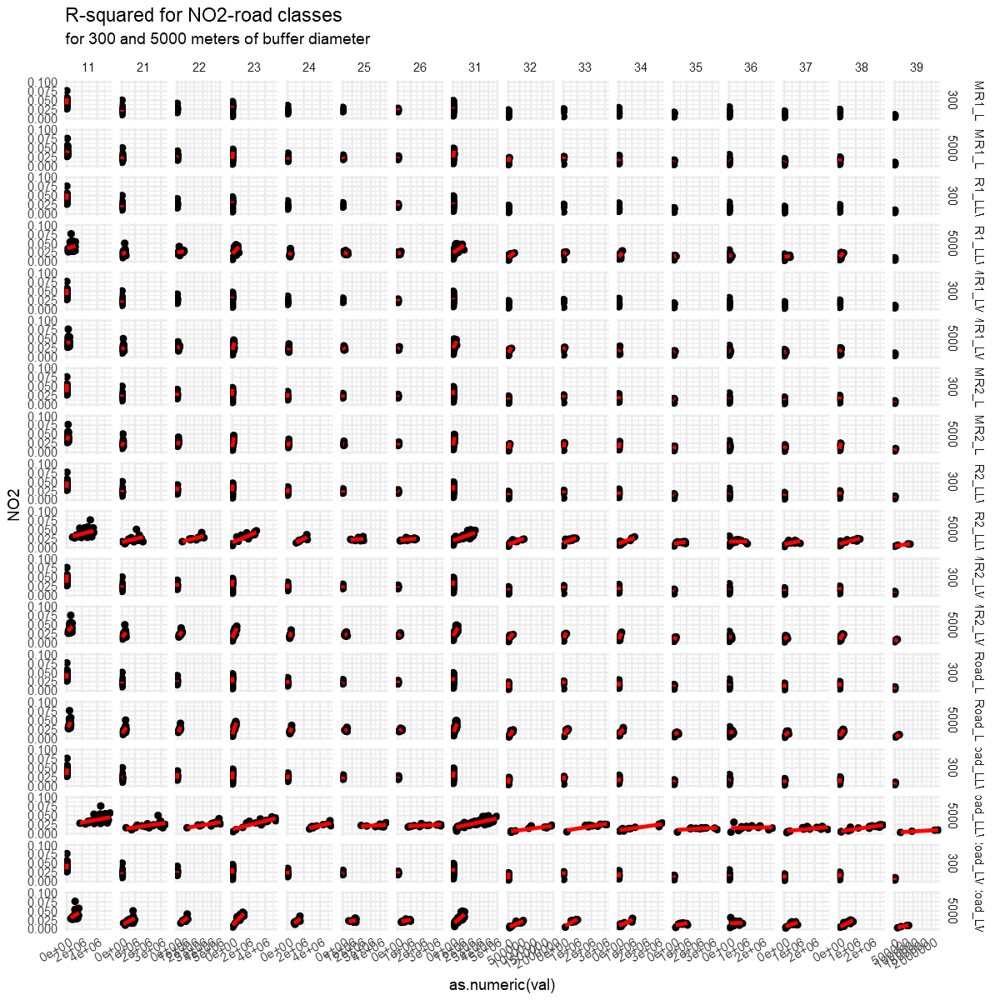

In [87]:
## Don't run this cell ##

## Assignment
+ 이번에는 다소 큰 규모의 과제를 드립니다. 결과 발표에는 최대 10분을 사용하실 수 있습니다.
+ 서울특별시 공공자전거 '따릉이' 분석
    + 자료
        + [대여소 정보](http://data.seoul.go.kr/dataList/datasetView.do?infId=OA-13252&srvType=S&serviceKind=1&currentPageNo=1)
        + [분기별 이용정보](http://data.seoul.go.kr/dataList/datasetView.do?infId=OA-15182&srvType=F&serviceKind=1&currentPageNo=1)
    + 상기 두 자료를 이용하여 __'관악구'__에 있는 대여소만 추출하여 아래를 수행하시오. (tip: 대여소코드와 좌표를 활용할 것)
        + __특정 연도, 특정 분기를 선택한 후에 분기 내의 월별로 분석하시오__ (시간 분석에는 `lubridate` 패키지를 이용하시오)
        + 기술통계와 일반시각화
            + 대여소 별 이용자 수, 이동거리 및 이용시간을 월별로 요약 분석하시오. bar, line chart 등을 활용하시오.
                + _도전과제_: 주말과 주중을 나누어 분석하시오 (주말과 주중 정보는 W3에 제공한 supplementary material 참고) 
            +  위 항목의 세 가지 요약요소 가운데서 하나를 골라 다음의 사항을 수행하시오: `ggplot`으로 만든 후 `ggplotly`를 적용한 결과 및 `plot_ly` 직접 적용한 결과를 각각 표시하시오.
        + 기술통계와 공간시각화
            + 대여소를 같은 크기와 같은 색상의 점으로 표시해 보시오. `leaflet` 패키지를 이용할 것
            + 대여소의 심볼을 총 이용자 수, 평균이용시간 등에 따라서 색상 또는 크기를 달리하여 나타내고, 월별로 별도의 지도를 만드시오. `tmap` 패키지를 이용할 것.
            + W3 보조자료인 행정동 폴리곤을 이용해서 행정동 내 대여소 수, 행정동 내 총 이용자 수 등을 choropleth map으로 나타내시오. 2가지 이상의 속성 분류법을 적용하여 지도를 제작할 것. `sf`패키지의 공간처리 함수 `st_intersection` 등을 활용할 것.
                + 지도 필수 요소(north arrow, scale bar, legend)를 반드시 포함해야 하며, 관악구 이외의 폴리곤은 제외할 것.